<a href="https://colab.research.google.com/github/JodhiKrisantus/Computer-Vision/blob/main/FINAL_OBJEK_DETECTION.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import cv2
import numpy as np
import glob
import random

In [2]:
from google.colab.patches import cv2_imshow

In [3]:
!pip install --upgrade --no-cache-dir gdown

In [4]:
!gdown --id 1-URk5Aneem7dZq5qFjHpAofUhXlAC3W4
!gdown --id 1QrDcI2zgGy3kznGfcT5KQUgdVwiIxcKz
!gdown --id 1vPKU74ZAQgMmEsZcBM4I9u9E8WT73zjk

/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1-URk5Aneem7dZq5qFjHpAofUhXlAC3W4
To: /content/yolov3_custom_final.weights
100% 246M/246M [00:04<00:00, 60.3MB/s]
/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Downloading...
From: https://drive.google.com/uc?id=1QrDcI2zgGy3kznGfcT5KQUgdVwiIxcKz
To: /content/yolov3_custom.cfg
100% 8.33k/8.33k [00:00<00:00, 9.21MB/s]
/usr/local/lib/python3.7/dist-packages/gdown/cli.py:131: FutureWarning: Option `--id` was deprecated in version 4.3.1 and will be removed in 5.0. You don't need to pass it anymore to use a file ID.
  category=FutureWarning,
Down

In [5]:
!unzip 'sample.zip' -d 'sample'

Archive:  sample.zip
  inflating: sample/21fdf.jpg        
  inflating: sample/21fdf.txt        
  inflating: sample/58i.jpg          
  inflating: sample/58i.txt          
  inflating: sample/5uhyf.jpg        
  inflating: sample/5uhyf.txt        
  inflating: sample/aw.jpg           
  inflating: sample/aw.txt           
  inflating: sample/b.jpg            
  inflating: sample/b.txt            
  inflating: sample/bcfx.jpg         
  inflating: sample/bcfx.txt         
  inflating: sample/bfhe.jpg         
  inflating: sample/bfhe.txt         
  inflating: sample/bfhrj.png        
  inflating: sample/bfhrj.txt        
  inflating: sample/bgv.jpg          
  inflating: sample/bgv.txt          
  inflating: sample/bn.jpg           
  inflating: sample/bn.txt           
  inflating: sample/Demonstration of Donning (Putting On) Personal Protective Equipment (PPE) 078 - Copy - Copy.jpg  
  inflating: sample/Demonstration of Donning (Putting On) Personal Protective Equipment (PPE) 078 - C

In [6]:
# Load Yolo
net = cv2.dnn.readNet("yolov3_custom_final.weights", "yolov3_custom.cfg")

# Name custom object
classes = ["face","apd"]

# Images path
images_path = glob.glob(r"sample/*.jpg")


()


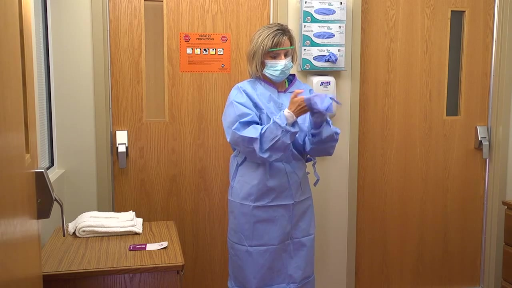

()


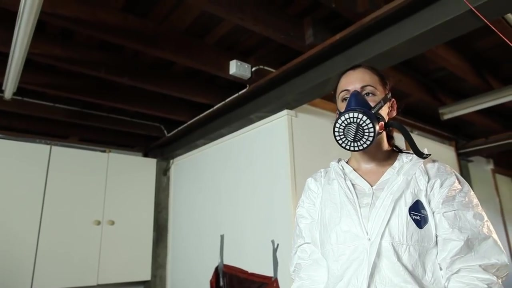

()


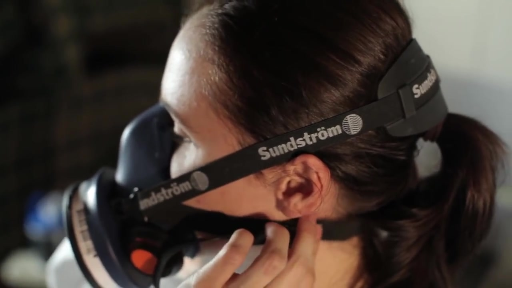

1
()


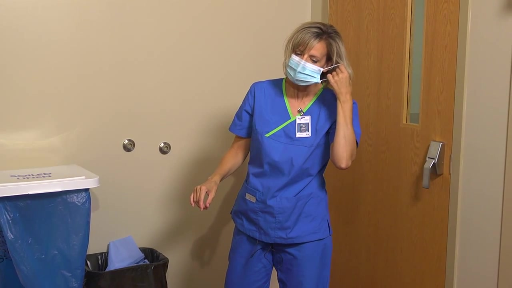

()


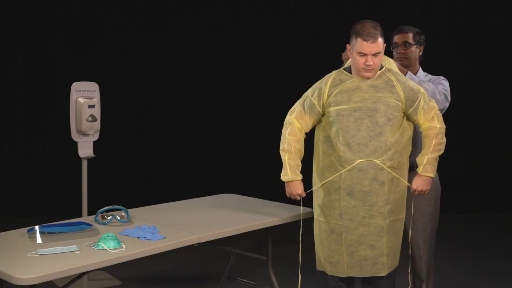

()


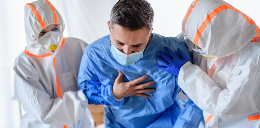

1
1
[[1]]


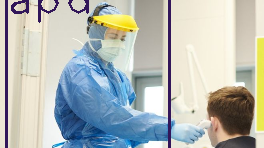

()


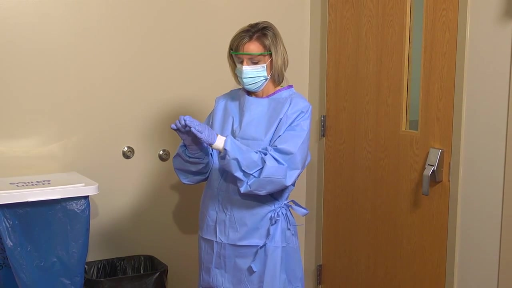

()


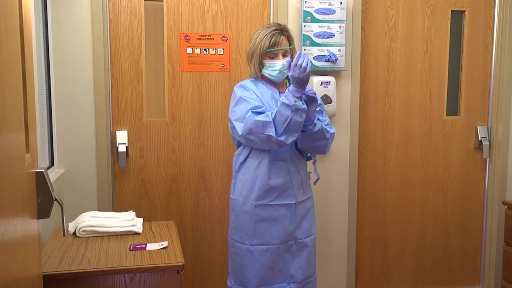

()


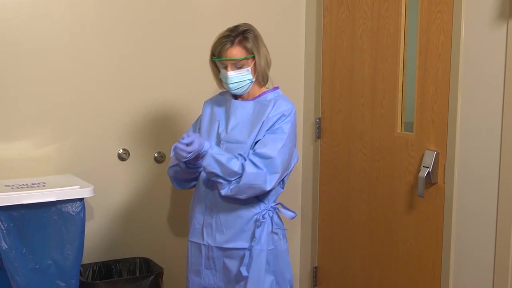

()


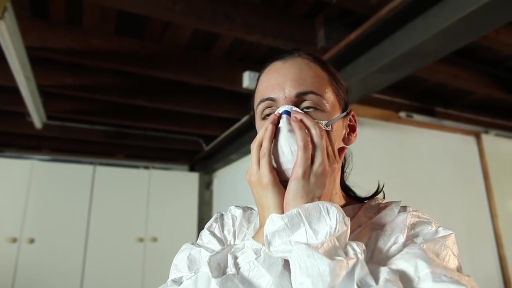

()


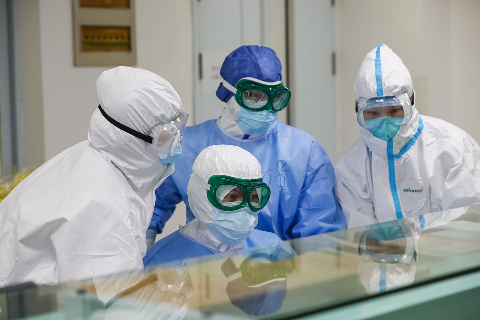

1
[[0]]


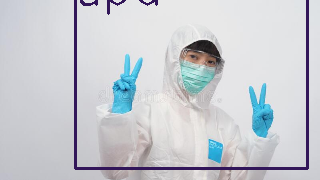

1
1
()


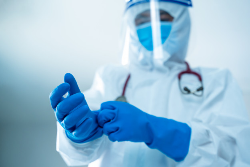

1
[[0]]


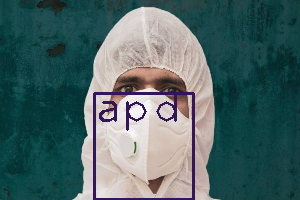

()


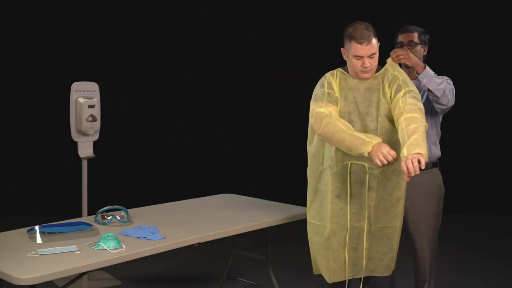

()


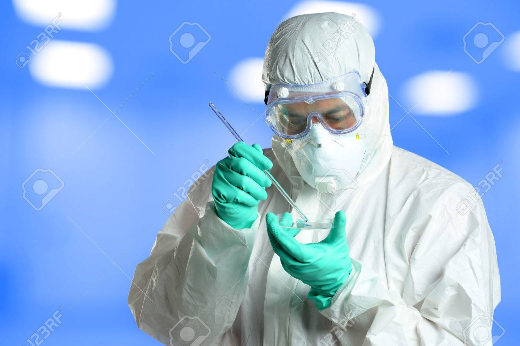

()


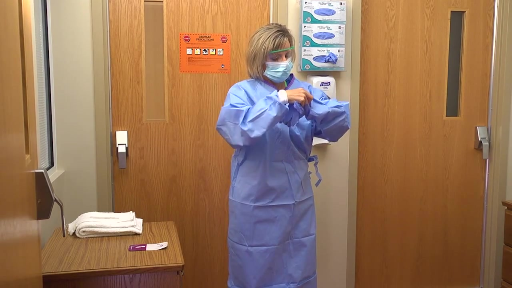

()


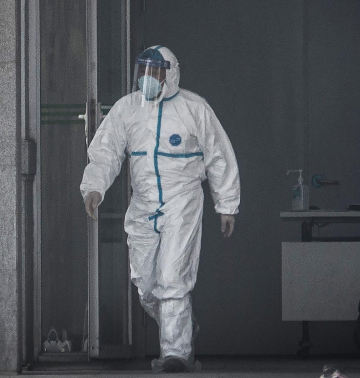

()


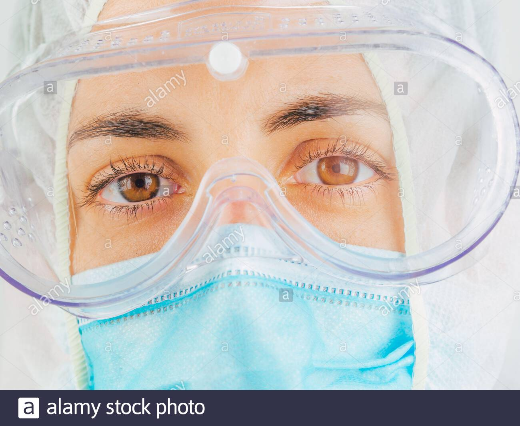

()


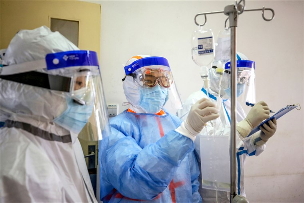

()


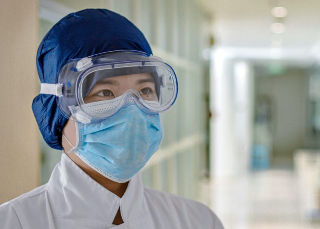

()


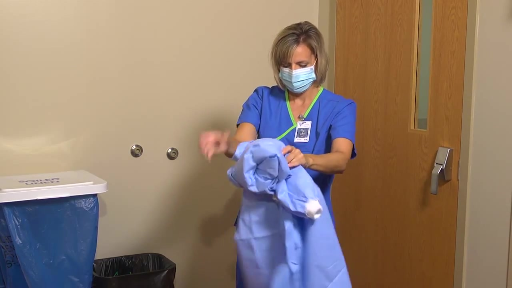

()


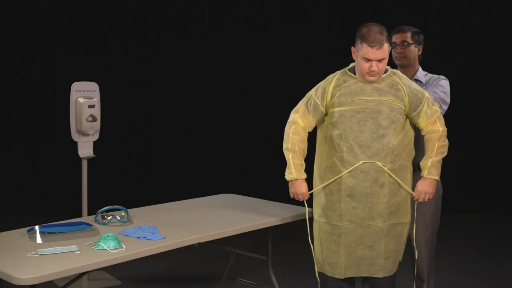

1
[[0]]


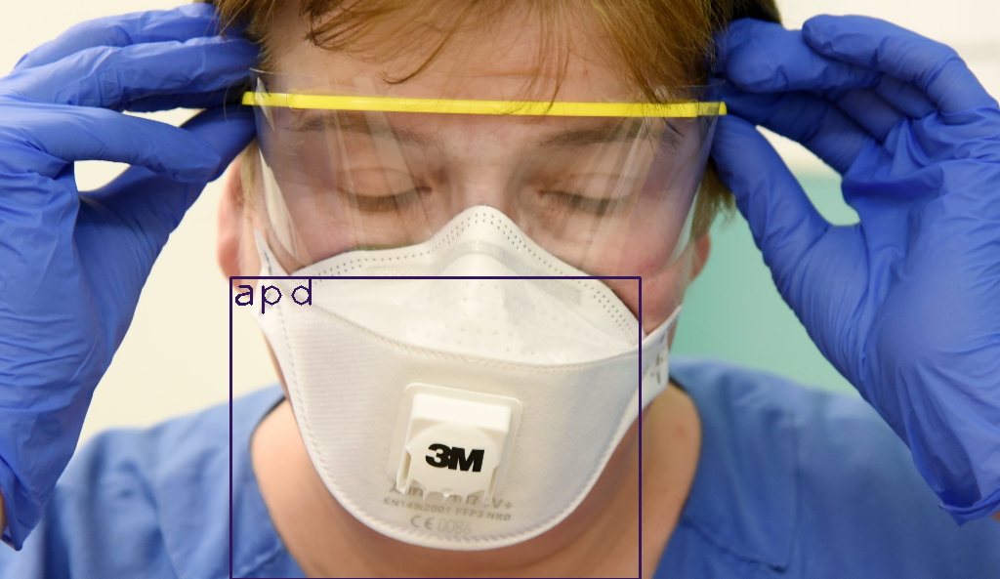

()


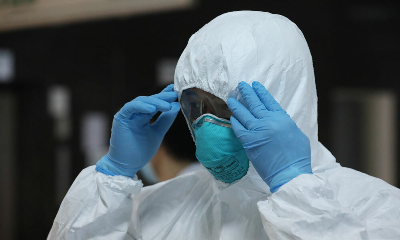

()


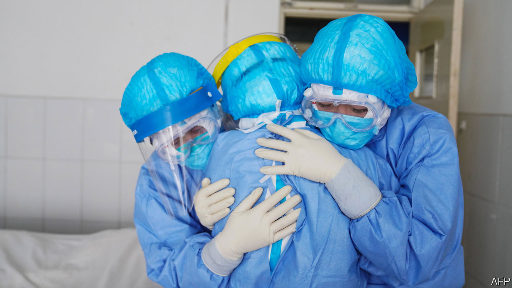

()


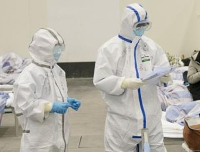

1
0
[[0]
 [1]]


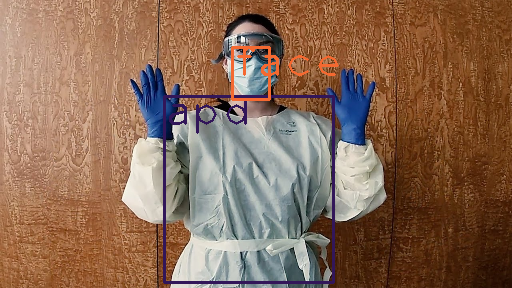

()


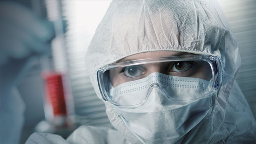

()


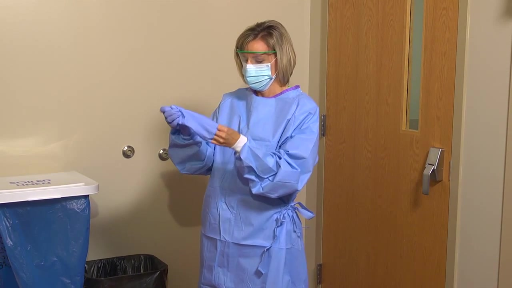

()


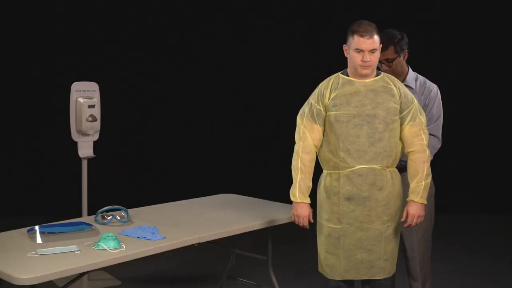

()


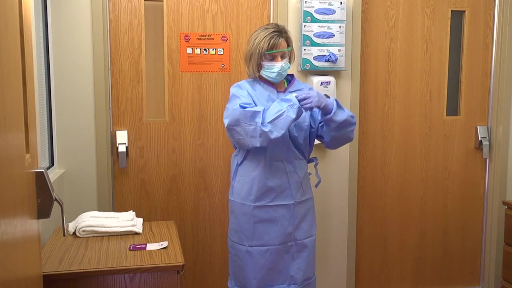

()


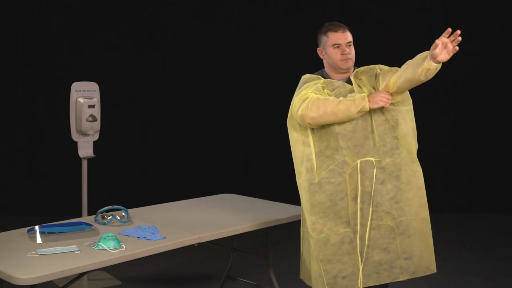

()


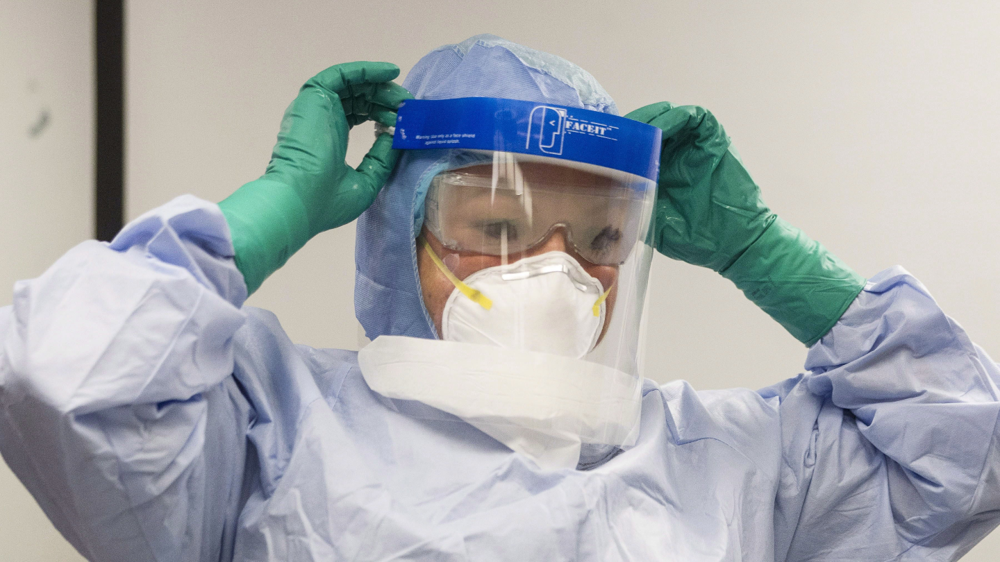

1
()


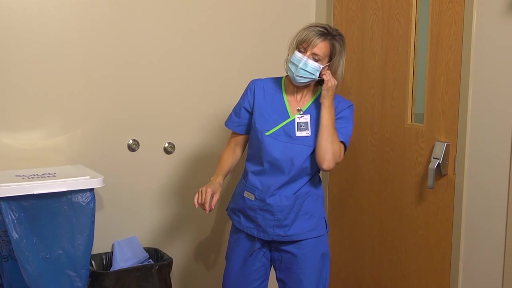

()


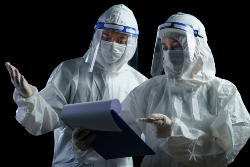

1
()


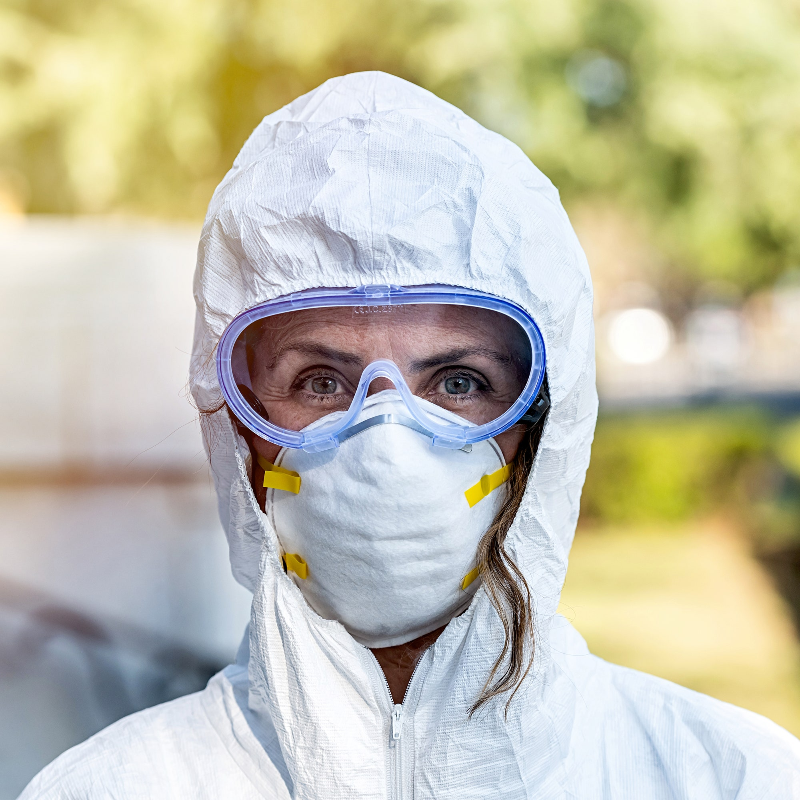

()


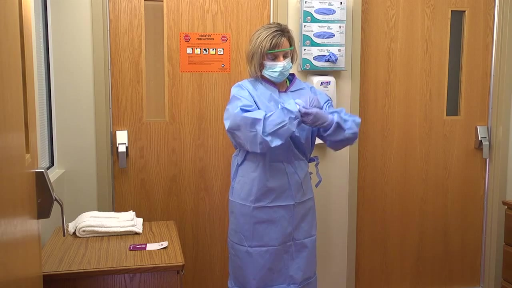

()


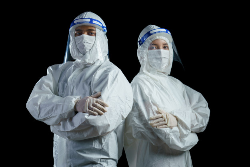

()


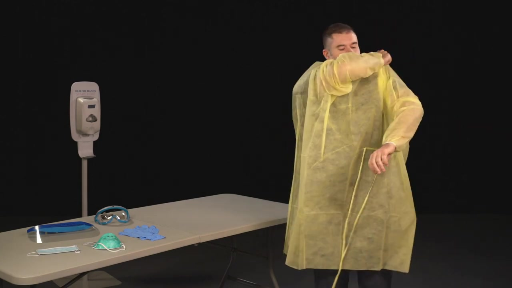

()


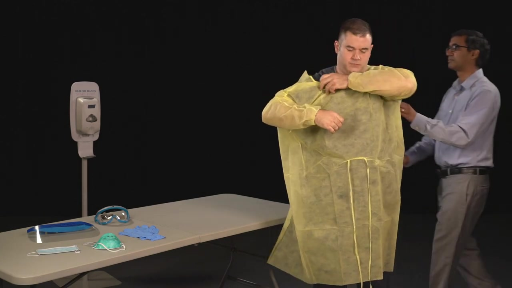

1
[[0]]


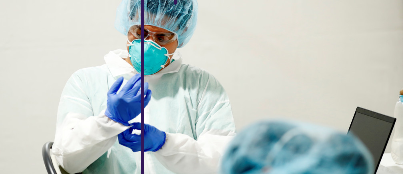

0
()


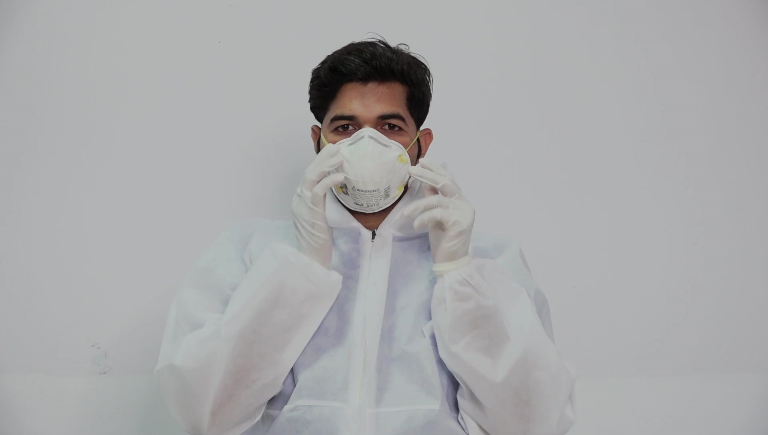

()


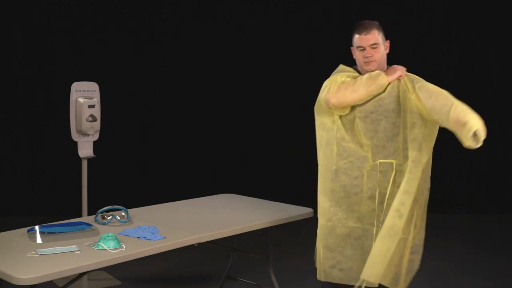

()


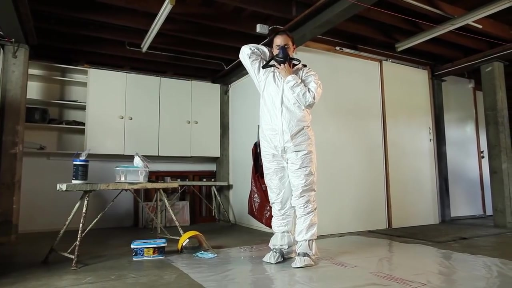

()


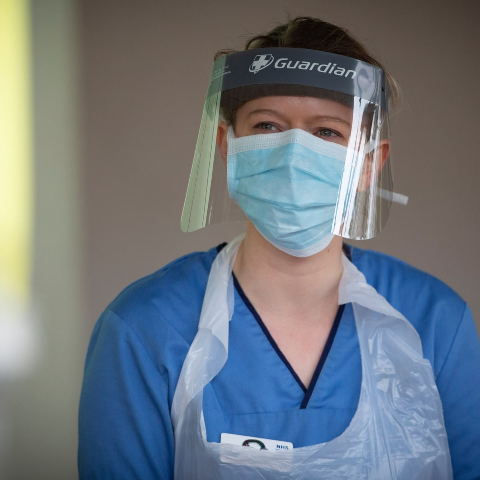

()


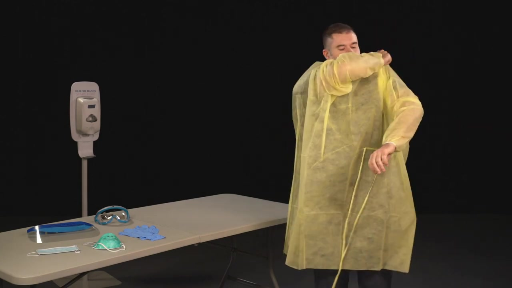

1
[[0]]


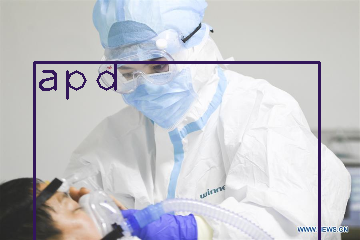

()


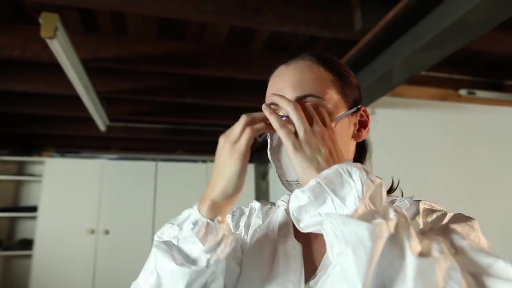

1
[[0]]


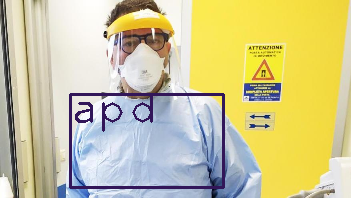

()


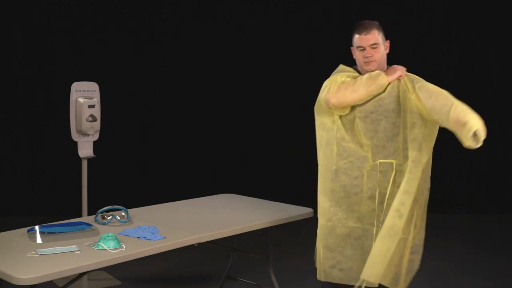

1
[[0]]


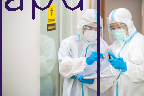

()


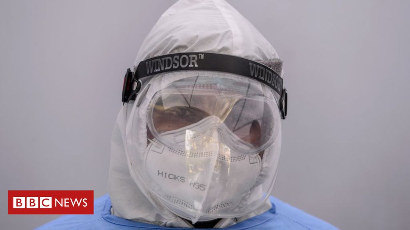

()


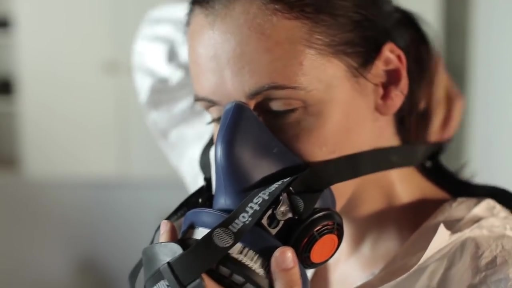

()


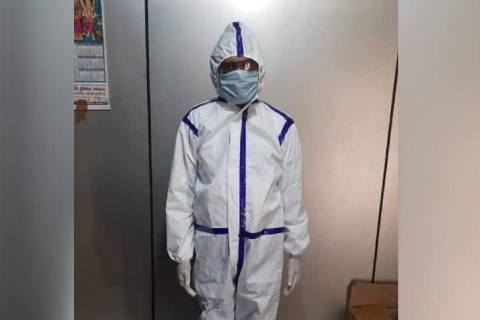

1
0
[[0]
 [1]]


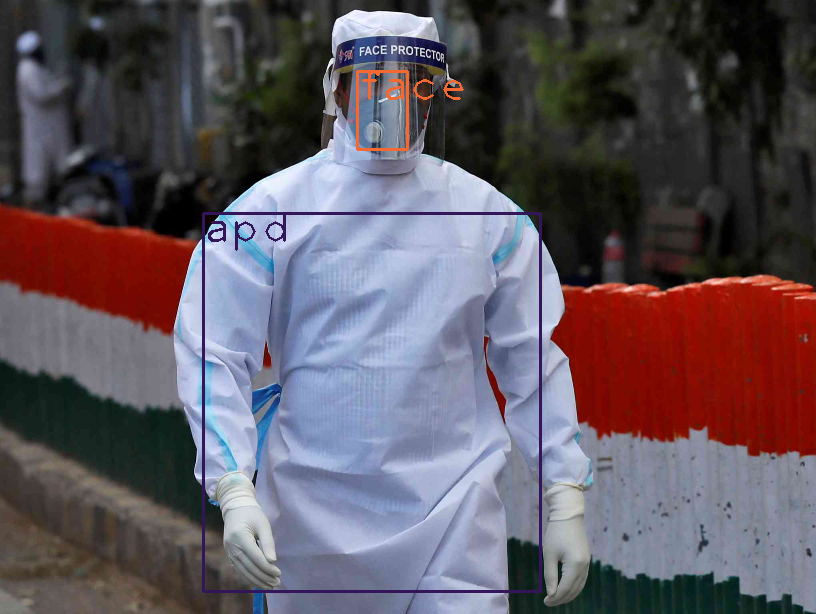

()


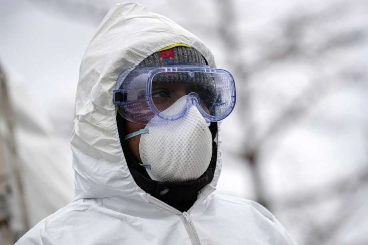

In [7]:
layer_names = net.getLayerNames()
output_layers = [layer_names[i[0] - 1] for i in net.getUnconnectedOutLayers()]
colors = np.random.uniform(0, 255, size=(len(classes), 3))

# Insert here the path of your images
random.shuffle(images_path)
# loop through all the images
for img_path in images_path:
    # Loading image
    img = cv2.imread(img_path)
    img = cv2.resize(img, None, fx=0.4, fy=0.4)
    height, width, channels = img.shape

    # Detecting objects
    blob = cv2.dnn.blobFromImage(img, 0.00392, (416, 416), (0, 0, 0), True, crop=False)

    net.setInput(blob)
    outs = net.forward(output_layers)

    # Showing informations on the screen
    class_ids = []
    confidences = []
    boxes = []
    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            confidence = scores[class_id]
            if confidence > 0.3:
                # Object detected
                print(class_id)
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)

                # Rectangle coordinates
                x = int(center_x - w / 2)
                y = int(center_y - h / 2)

                boxes.append([x, y, w, h])
                confidences.append(float(confidence))
                class_ids.append(class_id)

    indexes = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.4)
    print(indexes)
    font = cv2.FONT_HERSHEY_PLAIN
    for i in range(len(boxes)):
        if i in indexes:
            x, y, w, h = boxes[i]
            label = str(classes[class_ids[i]])
            color = colors[class_ids[i]]
            cv2.rectangle(img, (x, y), (x + w, y + h), color, 2)
            cv2.putText(img, label, (x, y + 30), font, 3, color, 2)


    # cv2.imshow("Image", img)
    cv2_imshow(img)
    key = cv2.waitKey(0) 
cv2.destroyAllWindows()